In [1]:
#import packages


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
#import geopandas as gpd
#from shapely.geometry import Point, Polygon, box
#import fiona
#import pyproj
#import contextily as ctx
import os
import requests
import matplotlib.ticker as ticker
import scipy.stats as stats
import matplotlib.pyplot as plt
from matplotlib import pyplot
from matplotlib.ticker import PercentFormatter
import requests
import matplotlib.colors as colors
import pandas as pd
import os
import glob
import seaborn as sns
import matplotlib.ticker as ticker


#%matplotlib widget
%matplotlib inline

In [2]:
!pip3 install openpyxl

# This notebook will combine the data logs collected from different instruments at UW

In [3]:
!pwd

/Users/amandaworthy/CS4EVN/Data


In [4]:
!ls

Data_Organization_AW.ipynb QUESTTEMP_Reports
Gas_Lab_Reports


In [5]:
#code to grab specific gaslab report

one= pd.read_csv("Gas_Lab_Reports/Allen 605/January-24-2023_Allen.csv", sep=',', header=[1])
one.head()



,Unnamed: 0,CO2,Temperature,Humidity,Unnamed: 4
0,01/24/23 14:12:31.119,0,24.05,32.57,NaN
1,01/24/23 14:13:31.110,593,24.20,32.06,NaN
2,01/24/23 14:14:31.110,590,24.32,31.96,NaN
3,01/24/23 14:15:31.098,597,24.39,31.79,NaN
4,01/24/23 14:16:31.102,594,24.46,31.48,NaN


## Read in all files from gaslab

In [6]:
import os
import pandas as pd
import glob
import openpyxl
path_co2 = os.path.abspath('Gas_Lab_Reports/Allen 605') 
files_co2 = os.listdir(path_co2) 
file_list_co2 = glob.glob(path_co2 + "/*.csv")
file_list_co2

['/Users/amandaworthy/CS4EVN/Data/Gas_Lab_Reports/Allen 605/January-24-2023_Allen.csv']

In [7]:
df = pd.DataFrame()
for file in file_list_co2:
    temp_df = pd.read_csv(file, header=[1])
    df = pd.concat([df, temp_df], axis=0)


#remove columns w only na
df= df.dropna(axis=1, how='all')

#rename columns
df= df.rename(columns= {"Unnamed: 0": "Timestamp", 'CO2': "CO2_gas_lab", 'Temperature': "Temperature_gas_lab", 'Humidity': "Humidity_gas_lab"})

#make datetime column a datetime :) 

df['Timestamp'] =  pd.to_datetime(df['Timestamp'], utc = True)
df["Timestamp"] = df["Timestamp"].dt.round("min")


#remove small/ zero observations
df= df[~(df['CO2_gas_lab'] <= 10)]
df

,Timestamp,CO2_gas_lab,Temperature_gas_lab,Humidity_gas_lab
1,2023-01-24 14:14:00+00:00,593,24.20,32.06
2,2023-01-24 14:15:00+00:00,590,24.32,31.96
3,2023-01-24 14:16:00+00:00,597,24.39,31.79
4,2023-01-24 14:17:00+00:00,594,24.46,31.48
5,2023-01-24 14:18:00+00:00,601,24.52,31.42
...,...,...,...,...
6654,2023-01-30 10:08:00+00:00,504,24.30,16.70
6655,2023-01-30 10:10:00+00:00,501,24.31,16.66
6656,2023-01-30 10:12:00+00:00,552,24.30,16.94
6657,2023-01-30 10:14:00+00:00,559,24.30,16.80


In [8]:
#intentionaly left blank

## Read in all files from Questtempo

In [9]:
!pwd

/Users/amandaworthy/CS4EVN/Data


In [10]:
import os
import pandas as pd
import glob
import openpyxl
path_temp = os.path.abspath('QUESTTEMP_Reports/Allen 605/') 
files_temp = os.listdir(path_temp) 
file_list_temp = glob.glob(path_temp + "/*.csv")
file_list_temp

['/Users/amandaworthy/CS4EVN/Data/QUESTTEMP_Reports/Allen 605/1_30_2023_Allen.csv',
 '/Users/amandaworthy/CS4EVN/Data/QUESTTEMP_Reports/Allen 605/1_20_2023_Allen_2.csv']

In [11]:
combined_csv = pd.concat([pd.read_csv(f) for f in file_list_temp ])
combined_csv

,Timestamp,DryBulb,Globe,HeatIndex,Humidity,WBGTIn,WBGTOut,WetBulb
0,1/30/2023 10:52:29 AM,23.9,24.0,NaN,13.0,15.3,15.3,11.6
1,1/30/2023 10:54:29 AM,23.9,24.1,NaN,13.1,15.3,15.3,11.6
2,1/30/2023 10:56:29 AM,24.0,24.0,NaN,13.0,15.3,15.3,11.6
3,1/30/2023 10:58:29 AM,24.0,24.0,NaN,13.2,15.3,15.3,11.6
4,1/30/2023 11:00:29 AM,24.0,23.9,NaN,13.2,15.3,15.3,11.6
...,...,...,...,...,...,...,...,...
8428,1/30/23 10:17,23.7,23.6,NaN,12.6,15.0,15.0,11.4
8429,1/30/23 10:19,23.7,23.7,NaN,12.6,15.1,15.1,11.4
8430,1/30/23 10:21,23.7,23.8,NaN,12.6,15.1,15.1,11.4
8431,1/30/23 10:23,23.8,23.8,NaN,12.4,15.1,15.1,11.4


In [12]:
df_temp = pd.DataFrame()
for file in file_list_temp:
    temp_df2 = pd.read_csv(file, header=[0])
    df_temp = pd.concat([temp_df2, df_temp], axis=0)
df_temp

#remove columns w only na
df_temp= df_temp.dropna(axis=1, how='all')

#rename columns
#df= df.rename(columns= {"Unnamed: 0": "Date_Time", 'CO2': "CO2_gas_lab", 'Temperature': "Temperature_gas_lab", 'Humidity': "Humidity_gas_lab"})

#make datetime column a datetime :) 

df_temp['Timestamp'] =  pd.to_datetime(df_temp['Timestamp'], utc = True)
df_temp

,Timestamp,DryBulb,Globe,HeatIndex,Humidity,WBGTIn,WBGTOut,WetBulb
0,2023-01-18 17:21:00+00:00,23.0,23.8,21.9,32.5,17.1,17.0,14.2
1,2023-01-18 17:23:00+00:00,23.2,23.8,22.0,31.8,17.1,17.0,14.2
2,2023-01-18 17:25:00+00:00,23.3,23.7,22.0,31.6,17.1,17.0,14.2
3,2023-01-18 17:27:00+00:00,23.3,23.6,22.0,31.2,17.0,17.0,14.2
4,2023-01-18 17:29:00+00:00,23.4,23.6,22.0,31.0,17.0,17.0,14.2
...,...,...,...,...,...,...,...,...
5759,2023-02-07 10:50:29+00:00,24.1,24.2,NaN,29.4,17.4,17.4,14.5
5760,2023-02-07 10:52:29+00:00,24.2,24.2,NaN,29.5,17.5,17.5,14.6
5761,2023-02-07 10:54:29+00:00,24.2,24.2,NaN,29.4,17.5,17.5,14.6
5762,2023-02-07 10:56:29+00:00,24.2,24.3,NaN,29.2,17.5,17.5,14.6


In [13]:
list(df_temp.columns)

['Timestamp',
 'DryBulb',
 'Globe',
 'HeatIndex',
 'Humidity',
 'WBGTIn',
 'WBGTOut',
 'WetBulb']

## Read in the ATMS Building Outdoor Data 

In [14]:
file_list_atms = os.path.abspath('/Users/amandaworthy/CS4EVN/UWASH Outdoor Data/') 
files_atms= os.listdir(file_list_atms) 
files_atms

['Outdoor_data_Airport_ATMS.ipynb',
 'Notes',
 'UWASH.2023-01-31.csv',
 '.ipynb_checkpoints',
 'UWASH.2023-02-06.csv',
 'KSEA.2023-02-06.csv']

In [15]:
atms_file= "/Users/amandaworthy/CS4EVN/UWASH Outdoor Data/UWASH.2023-01-31.csv"
UWASH = pd.read_csv(atms_file, sep=',', header=[10])
#remove station ID 
UWASH= UWASH.drop(['Station_ID'], axis=1)
#remove units 
UWASH= UWASH.drop(0,axis=0)

#make pd datetime 
UWASH.Date_Time= pd.to_datetime(UWASH.Date_Time, utc = False)

#convert all to numbers besides the wind, date

cols = UWASH.columns.drop(['Date_Time','wind_cardinal_direction_set_1d'])
#cols = UWASH.columns.drop(['Date_Time'])

UWASH[cols] = UWASH[cols].apply(pd.to_numeric, errors='coerce')

#drop cols with no data 
UWASH= UWASH.dropna(axis=1, how='all')

#rename columns 
UWASH= UWASH.rename(columns= {"Date_Time": "Timestamp", 'air_temp_set_1': "outdoor_air_temp_C", 'relative_humidity_set_1': "outdoor_relative_humidity_%", 'wind_chill_set_1d': "outdoor_wind_chill_C", 'heat_index_set_1d': "heat_index_C", "wind_speed_set_1": "outdoor_wind_speed_mpers", 
                             "wind_direction_set_1": "outdoor_wind_direction_deg", "wind_gust_set_1": "Outdoor_wind_gust_mpers","precip_accum_set_1" : "precip_accum_mm","sea_level_pressure_set_1": "sea_level_pressure_pascals", "dew_point_temperature_set_1d": "dew_point_temperature_C",  "wind_cardinal_direction_set_1d": "wind_cardinal_direction"   })

UWASH.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 710 entries, 1 to 710
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype              
---  ------                       --------------  -----              
 0   Timestamp                    710 non-null    datetime64[ns, UTC]
 1   outdoor_air_temp_C           710 non-null    float64            
 2   outdoor_relative_humidity_%  710 non-null    float64            
 3   outdoor_wind_speed_mpers     710 non-null    float64            
 4   outdoor_wind_direction_deg   710 non-null    float64            
 5   Outdoor_wind_gust_mpers      710 non-null    float64            
 6   precip_accum_mm              339 non-null    float64            
 7   sea_level_pressure_pascals   710 non-null    float64            
 8   dew_point_temperature_C      710 non-null    float64            
 9   outdoor_wind_chill_C         1 non-null      float64            
 10  wind_cardinal_direction      710 non-null    objec

In [16]:
list(UWASH.columns)

['Timestamp',
 'outdoor_air_temp_C',
 'outdoor_relative_humidity_%',
 'outdoor_wind_speed_mpers',
 'outdoor_wind_direction_deg',
 'Outdoor_wind_gust_mpers',
 'precip_accum_mm',
 'sea_level_pressure_pascals',
 'dew_point_temperature_C',
 'outdoor_wind_chill_C',
 'wind_cardinal_direction']

In [17]:
UWASH.head()

,Timestamp,outdoor_air_temp_C,outdoor_relative_humidity_%,outdoor_wind_speed_mpers,outdoor_wind_direction_deg,Outdoor_wind_gust_mpers,precip_accum_mm,sea_level_pressure_pascals,dew_point_temperature_C,outdoor_wind_chill_C,wind_cardinal_direction
1,2023-01-01 12:55:00+00:00,5.56,100.0,0.00,82.0,0.00,0.0,101900.0,5.56,NaN,E
2,2023-01-01 13:55:00+00:00,6.11,100.0,1.03,311.0,1.03,0.0,101950.0,6.11,NaN,NW
3,2023-01-01 14:55:00+00:00,6.11,100.0,0.00,352.0,1.03,0.0,101990.0,6.11,NaN,N
4,2023-01-01 15:55:00+00:00,6.11,100.0,0.00,90.0,0.51,0.0,101960.0,6.11,NaN,E
5,2023-01-01 16:55:00+00:00,6.11,100.0,0.51,313.0,1.03,0.0,102050.0,6.11,NaN,NW


In [18]:
#intentionaly left blank

## Merge the two df together from CO2 sensor and Questtempo
#### Merge by timestamp

In [19]:
print(df_temp.shape)
df_temp.head()

(14197, 8)


,Timestamp,DryBulb,Globe,HeatIndex,Humidity,WBGTIn,WBGTOut,WetBulb
0,2023-01-18 17:21:00+00:00,23.0,23.8,21.9,32.5,17.1,17.0,14.2
1,2023-01-18 17:23:00+00:00,23.2,23.8,22.0,31.8,17.1,17.0,14.2
2,2023-01-18 17:25:00+00:00,23.3,23.7,22.0,31.6,17.1,17.0,14.2
3,2023-01-18 17:27:00+00:00,23.3,23.6,22.0,31.2,17.0,17.0,14.2
4,2023-01-18 17:29:00+00:00,23.4,23.6,22.0,31.0,17.0,17.0,14.2


In [20]:
print(df.shape)
df.head()

(6658, 4)


,Timestamp,CO2_gas_lab,Temperature_gas_lab,Humidity_gas_lab
1,2023-01-24 14:14:00+00:00,593,24.20,32.06
2,2023-01-24 14:15:00+00:00,590,24.32,31.96
3,2023-01-24 14:16:00+00:00,597,24.39,31.79
4,2023-01-24 14:17:00+00:00,594,24.46,31.48
5,2023-01-24 14:18:00+00:00,601,24.52,31.42


In [26]:
#want to merge but keep all values 
df_temp_co2= pd.merge(df_temp, df, on= "Timestamp", how='inner')

df_temp_co2.sort_values(by='Timestamp', inplace = True) 
df_temp_co2.tail()


,Timestamp,DryBulb,Globe,HeatIndex,Humidity,WBGTIn,WBGTOut,WetBulb,CO2_gas_lab,Temperature_gas_lab,Humidity_gas_lab
3324,2023-01-30 09:59:00+00:00,23.7,23.7,NaN,12.3,15.0,15.0,11.3,505,24.30,16.66
3325,2023-01-30 10:01:00+00:00,23.7,23.6,NaN,12.3,15.0,15.0,11.3,504,24.27,16.66
3326,2023-01-30 10:03:00+00:00,23.7,23.6,NaN,12.4,15.0,15.0,11.3,505,24.29,16.66
3327,2023-01-30 10:05:00+00:00,23.7,23.6,NaN,12.4,15.0,15.0,11.3,505,24.30,16.66
3328,2023-01-30 10:07:00+00:00,23.7,23.6,NaN,12.4,15.0,15.0,11.3,503,24.30,16.70


In [27]:
#want to merge but keep all values 
df_all= pd.merge(df_temp_co2, UWASH, on= "Timestamp", how='inner')

df_all.sort_values(by='Timestamp', inplace = True) 
df_all.tail()

,Timestamp,DryBulb,Globe,HeatIndex,Humidity,WBGTIn,WBGTOut,WetBulb,CO2_gas_lab,Temperature_gas_lab,...,outdoor_air_temp_C,outdoor_relative_humidity_%,outdoor_wind_speed_mpers,outdoor_wind_direction_deg,Outdoor_wind_gust_mpers,precip_accum_mm,sea_level_pressure_pascals,dew_point_temperature_C,outdoor_wind_chill_C,wind_cardinal_direction
104,2023-01-29 19:55:00+00:00,23.9,23.8,NaN,11.2,15.0,15.0,11.2,472,24.41,...,4.44,52.0,3.60,54.0,5.14,NaN,103230.0,-4.66,NaN,NE
105,2023-01-29 21:55:00+00:00,23.8,23.8,NaN,11.9,15.0,15.0,11.3,485,24.39,...,-8.89,47.0,4.63,281.0,7.20,NaN,103150.0,-18.26,NaN,W
106,2023-01-30 02:55:00+00:00,23.7,23.5,NaN,11.4,14.9,14.9,11.1,480,24.30,...,2.78,47.0,3.60,345.0,4.63,NaN,103070.0,-7.53,NaN,NNW
107,2023-01-30 03:55:00+00:00,23.7,23.5,NaN,11.9,14.9,14.9,11.2,487,24.31,...,2.78,49.0,1.54,25.0,3.09,NaN,103080.0,-6.99,NaN,NNE
108,2023-01-30 08:55:00+00:00,23.7,23.6,NaN,12.3,15.0,15.0,11.3,504,24.28,...,-10.56,59.0,3.09,76.0,4.12,NaN,103130.0,-17.10,NaN,ENE


In [28]:
df_temp_co2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3329 entries, 0 to 3328
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   Timestamp            3329 non-null   datetime64[ns, UTC]
 1   DryBulb              3329 non-null   float64            
 2   Globe                3329 non-null   float64            
 3   HeatIndex            787 non-null    float64            
 4   Humidity             3329 non-null   float64            
 5   WBGTIn               3329 non-null   float64            
 6   WBGTOut              3329 non-null   float64            
 7   WetBulb              3329 non-null   float64            
 8   CO2_gas_lab          3329 non-null   int64              
 9   Temperature_gas_lab  3329 non-null   float64            
 10  Humidity_gas_lab     3329 non-null   float64            
dtypes: datetime64[ns, UTC](1), float64(9), int64(1)
memory usage: 312.1 KB


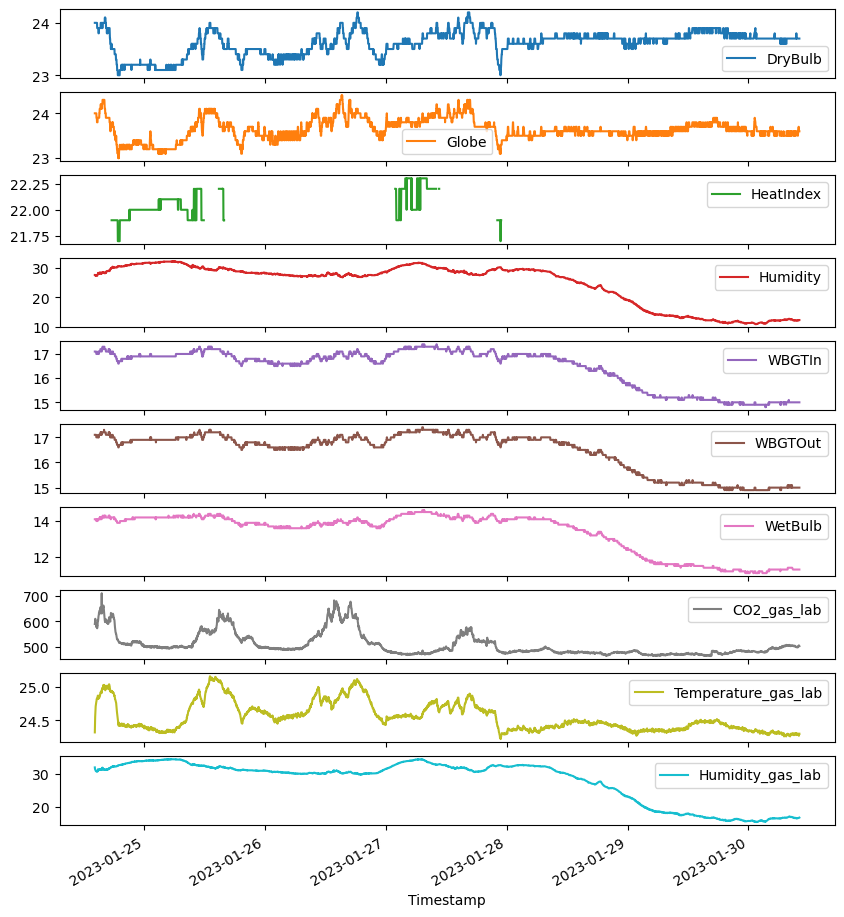

In [29]:
df_temp_co2= df_temp_co2.set_index('Timestamp')
df_temp_co2.plot(subplots=True, figsize=(10,12));

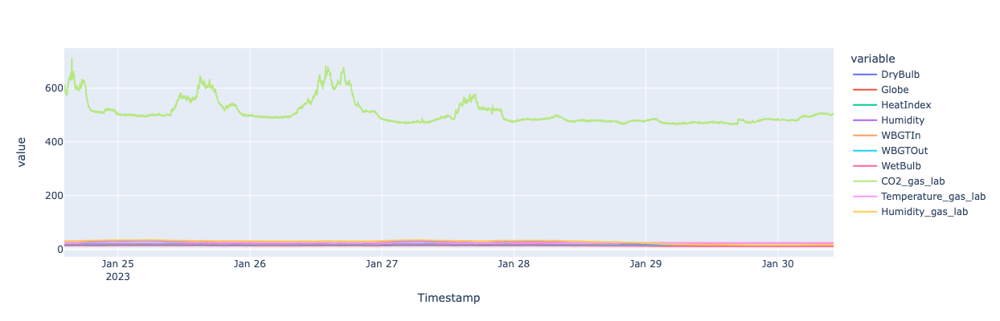

In [37]:
import plotly.express as px

px.line(df_temp_co2, x = df_temp_co2.index, y = df_temp_co2.columns, width=800, height=400)

In [38]:
list(df_temp.columns)

['Timestamp',
 'DryBulb',
 'Globe',
 'HeatIndex',
 'Humidity',
 'WBGTIn',
 'WBGTOut',
 'WetBulb']

In [55]:
list(df_temp.columns)

temp_columns= ['DryBulb',
 'Globe',
 'WBGTIn',
 'WBGTOut',
 'WetBulb']

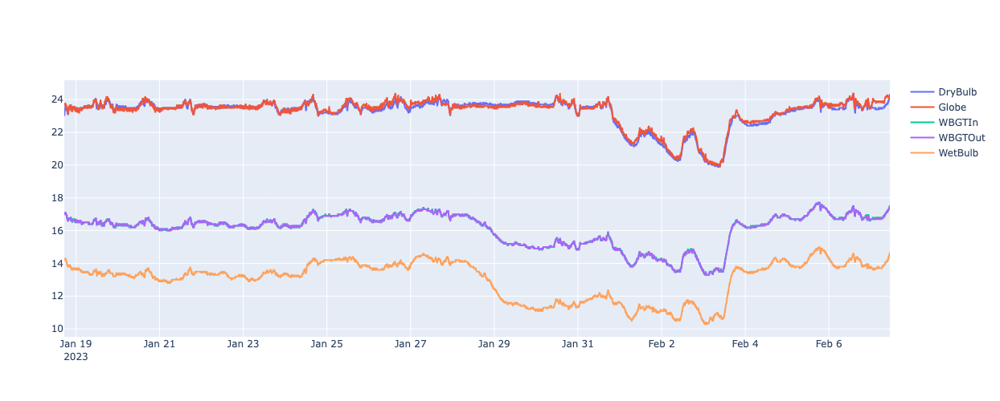

In [56]:
import plotly.graph_objs as go

layout = go.Layout(
    autosize=False,
    width=1000,
    height=500)
    
    
fig = go.Figure([{
    'x': df_temp.Timestamp,
    'y': df_temp[col],
    'name': col
}  for col in temp_columns], layout=layout)
fig.show()

In [44]:
df_all= df_all.set_index('Timestamp')

In [45]:
list(df_all.columns)

['DryBulb',
 'Globe',
 'HeatIndex',
 'Humidity',
 'WBGTIn',
 'WBGTOut',
 'WetBulb',
 'CO2_gas_lab',
 'Temperature_gas_lab',
 'Humidity_gas_lab',
 'outdoor_air_temp_C',
 'outdoor_relative_humidity_%',
 'outdoor_wind_speed_mpers',
 'outdoor_wind_direction_deg',
 'Outdoor_wind_gust_mpers',
 'precip_accum_mm',
 'sea_level_pressure_pascals',
 'dew_point_temperature_C',
 'outdoor_wind_chill_C',
 'wind_cardinal_direction']

In [46]:
temp_columns= ['DryBulb',
 'Globe',
 'Temperature_gas_lab'] #,'outdoor_air_temp_C']

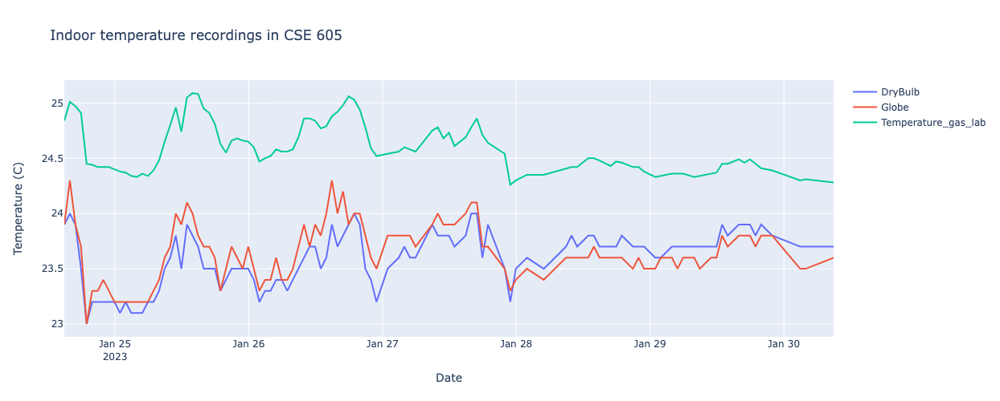

In [47]:
import plotly.graph_objs as go

layout = go.Layout(
    autosize=False,
    width=1000,
    height=500)
    
    
fig = go.Figure([{
    'x': df_all.index,
    'y': df_all[col],
    'name': col
}  for col in temp_columns], layout=layout).update_layout(
    xaxis_title="Date", yaxis_title="Temperature (C)", title= 'Indoor temperature recordings in CSE 605', 
)
fig.show()

In [48]:
list(df_all.columns)


['DryBulb',
 'Globe',
 'HeatIndex',
 'Humidity',
 'WBGTIn',
 'WBGTOut',
 'WetBulb',
 'CO2_gas_lab',
 'Temperature_gas_lab',
 'Humidity_gas_lab',
 'outdoor_air_temp_C',
 'outdoor_relative_humidity_%',
 'outdoor_wind_speed_mpers',
 'outdoor_wind_direction_deg',
 'Outdoor_wind_gust_mpers',
 'precip_accum_mm',
 'sea_level_pressure_pascals',
 'dew_point_temperature_C',
 'outdoor_wind_chill_C',
 'wind_cardinal_direction']

In [49]:
df.head()

df= df[~(df['CO2_gas_lab'] <= 10)]

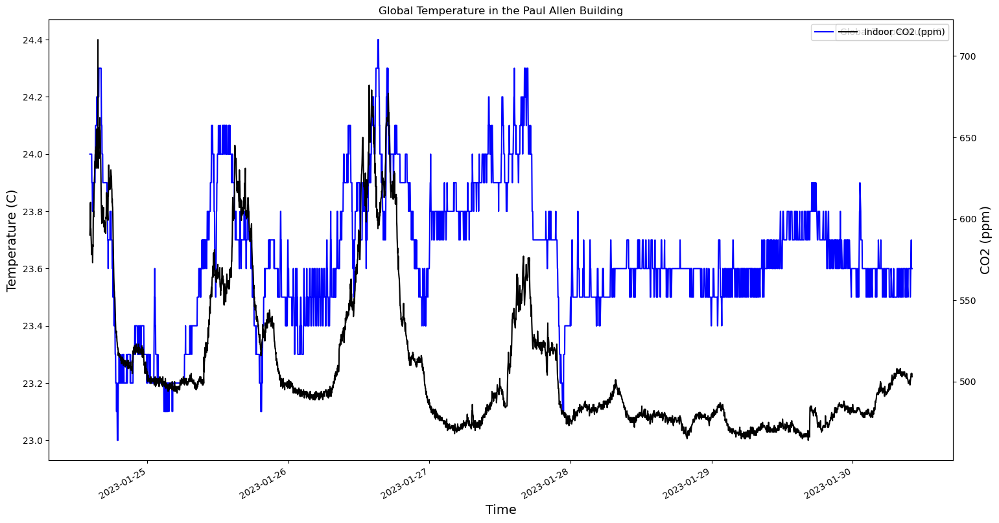

In [50]:
fig,ax = plt.subplots(figsize=(18,10))

ax2 = ax.twinx()

df_temp_co2.plot(y='CO2_gas_lab' ,color='k', markerfacecolor='white', ax=ax2, label = "Indoor CO2 (ppm)",use_index=True)
#ins.plot(x='Date_Time', y='TA',color='dodgerblue', markerfacecolor='white', ax=ax, label = "Indoor TA")

#should drop 0 

df_temp_co2.plot( y='Globe' ,color='b', markerfacecolor='white', ax=ax, label = "Global Temperature (C)", use_index=True)
#ins.plot(x='Date_Time', y='TA',color='dodgerblue', markerfacecolor='white', ax=ax, label = "Indoor TA")


ax.set_title('Global Temperature in the Paul Allen Building')
ax.set_xlabel("Time",fontsize=14)
ax.set_ylabel("Temperature (C)",color='k',fontsize=14);
ax2.set_ylabel("CO2 (ppm)",color='k',fontsize=14);


In [51]:
df['time_hour'] = df['Timestamp'].dt.hour
df_temp['time_hour'] = df_temp['Timestamp'].dt.hour

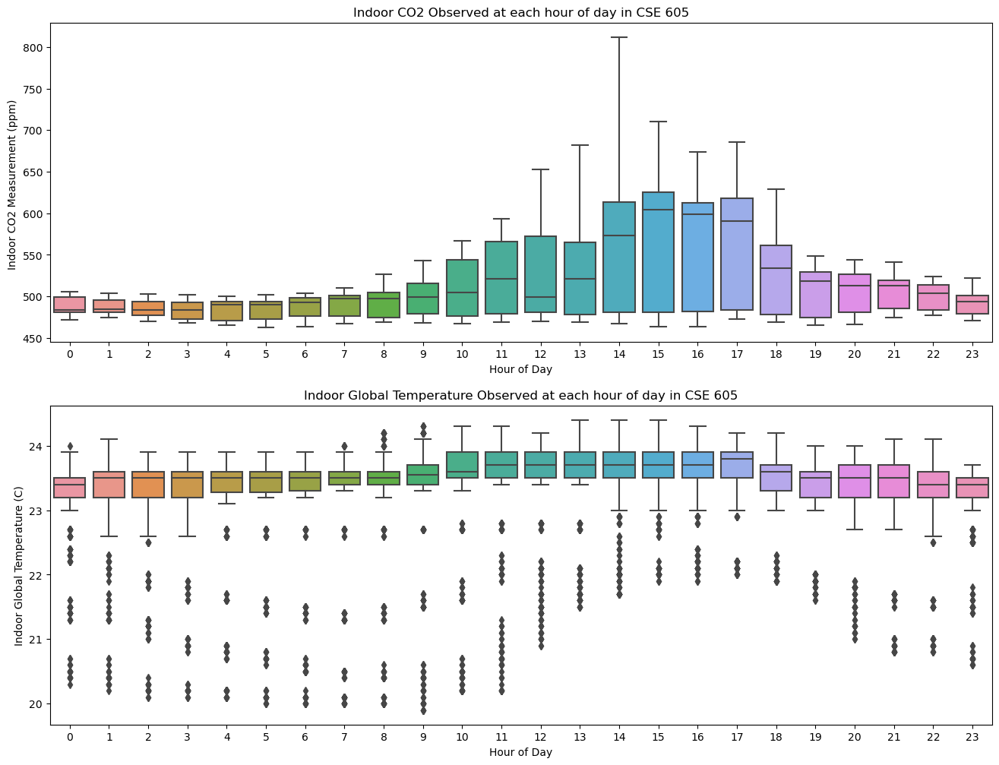

In [52]:
import matplotlib.pyplot as plt
import seaborn



fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1,figsize=(16,12))

seaborn.boxplot(x = df.time_hour, 
                y = df.CO2_gas_lab,
                #palette=my_pal,
                ax = ax0)

seaborn.boxplot(x = df_temp.time_hour, 
                y = df_temp.Globe,
                #palette=my_pal,
                ax = ax1)



ax0.set(ylabel='Indoor CO2 Measurement (ppm) ',
       xlabel='Hour of Day',
       title='Indoor CO2 Observed at each hour of day in CSE 605');

ax1.set(ylabel='Indoor Global Temperature (C)',
       xlabel='Hour of Day',
       title='Indoor Global Temperature Observed at each hour of day in CSE 605');

#plt.savefig('box_plot_hour.pdf')  